# Overview of this project
<p> This project involve careful analysis of the two dataset which are customer data and transaction data</p>
<p>In this project we will be performing data cleaning, wrangling, and data exploration as well as performing statiscal among the variables</p>

In [2]:
import pandas as pd
import numpy as np

Importing the dataset

In [3]:
# for purchase behaviour
qp = pd.read_csv('C:/Users/User/Documents/Quatum Intenship/purchaseBehaviour.csv')

In [4]:
# for transaction data
qt = pd.read_excel('C:/Users/User/Documents/Quatum Intenship/datEQVI_transaction_data.xlsx')

In [5]:
qp.head()

,LYLTY_CARD_NBR,LIFESTAGE,PREMIUM_CUSTOMER
0,1000,YOUNG SINGLES/COUPLES,Premium
1,1002,YOUNG SINGLES/COUPLES,Mainstream
2,1003,YOUNG FAMILIES,Budget
3,1004,OLDER SINGLES/COUPLES,Mainstream
4,1005,MIDAGE SINGLES/COUPLES,Mainstream


In [6]:
qt.head()

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
0,2018-10-17,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3
2,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9
3,2018-08-17,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0
4,2018-08-18,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8


# Performing Exploring Data Analysis

In [7]:
qt.describe(include='all')

C:\Users\User\AppData\Local\Temp/ipykernel_5028/1830134173.py:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  qt.describe(include='all')


,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
count,264836,264836.00000,2.648360e+05,2.648360e+05,264836.000000,264836,264836.000000,264836.000000
unique,364,NaN,NaN,NaN,NaN,114,NaN,NaN
top,2018-12-24 00:00:00,NaN,NaN,NaN,NaN,Kettle Mozzarella Basil & Pesto 175g,NaN,NaN
freq,939,NaN,NaN,NaN,NaN,3304,NaN,NaN
first,2018-07-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,2019-06-30 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,135.08011,1.355495e+05,1.351583e+05,56.583157,NaN,1.907309,7.304200
std,NaN,76.78418,8.057998e+04,7.813303e+04,32.826638,NaN,0.643654,3.083226
min,NaN,1.00000,1.000000e+03,1.000000e+00,1.000000,NaN,1.000000,1.500000
25%,NaN,70.00000,7.002100e+04,6.760150e+04,28.000000,NaN,2.000000,5.400000


In [8]:
qp.describe(include='all')

,LYLTY_CARD_NBR,LIFESTAGE,PREMIUM_CUSTOMER
count,7.263700e+04,72637,72637
unique,NaN,7,3
top,NaN,RETIREES,Mainstream
freq,NaN,14805,29245
mean,1.361859e+05,NaN,NaN
std,8.989293e+04,NaN,NaN
min,1.000000e+03,NaN,NaN
25%,6.620200e+04,NaN,NaN
50%,1.340400e+05,NaN,NaN
75%,2.033750e+05,NaN,NaN


Checkikng for null variables in the dataset

In [9]:
# For the transaction dataset
qt.isnull().sum()

DATE              0
STORE_NBR         0
LYLTY_CARD_NBR    0
TXN_ID            0
PROD_NBR          0
PROD_NAME         0
PROD_QTY          0
TOT_SALES         0
dtype: int64

In [10]:
# For the Purchacse behaviour dataset
qp.isnull().sum()

LYLTY_CARD_NBR      0
LIFESTAGE           0
PREMIUM_CUSTOMER    0
dtype: int64

# Result from the checking of the null(NaN) in the dataset
<p> We found out that there is no null data in all the columns</p>

# <b>Checking the datatypes and converting to necessary data format</b>

In [11]:
qt

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
0,2018-10-17,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3
2,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9
3,2018-08-17,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0
4,2018-08-18,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8
...,...,...,...,...,...,...,...,...
264831,2019-03-09,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8
264832,2018-08-13,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4
264833,2018-11-06,272,272379,270187,51,Doritos Mexicana 170g,2,8.8
264834,2018-12-27,272,272379,270188,42,Doritos Corn Chip Mexican Jalapeno 150g,2,7.8


**For QT dataset**

In [12]:
qt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 264836 entries, 0 to 264835
Data columns (total 8 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   DATE            264836 non-null  datetime64[ns]
 1   STORE_NBR       264836 non-null  int64         
 2   LYLTY_CARD_NBR  264836 non-null  int64         
 3   TXN_ID          264836 non-null  int64         
 4   PROD_NBR        264836 non-null  int64         
 5   PROD_NAME       264836 non-null  object        
 6   PROD_QTY        264836 non-null  int64         
 7   TOT_SALES       264836 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(5), object(1)
memory usage: 16.2+ MB


**Result** 
<p> We found out that out that there are 8 columns in this dataset and 264836 rows in the dataset </p>
<p>We only need to convert Date column as (datetype)</p>

In [13]:
# Converting the DATE column
#qt['DATE'] = pd.to_datetime(qt['DATE'],format='%D%m%y')
#qt['DATE'] = pd.to_datetime(qt['DATE']).dt.date
# Let confirm whether the DATE as been converted
qt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 264836 entries, 0 to 264835
Data columns (total 8 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   DATE            264836 non-null  datetime64[ns]
 1   STORE_NBR       264836 non-null  int64         
 2   LYLTY_CARD_NBR  264836 non-null  int64         
 3   TXN_ID          264836 non-null  int64         
 4   PROD_NBR        264836 non-null  int64         
 5   PROD_NAME       264836 non-null  object        
 6   PROD_QTY        264836 non-null  int64         
 7   TOT_SALES       264836 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(5), object(1)
memory usage: 16.2+ MB


**For Qp dataset**

In [14]:
qp

,LYLTY_CARD_NBR,LIFESTAGE,PREMIUM_CUSTOMER
0,1000,YOUNG SINGLES/COUPLES,Premium
1,1002,YOUNG SINGLES/COUPLES,Mainstream
2,1003,YOUNG FAMILIES,Budget
3,1004,OLDER SINGLES/COUPLES,Mainstream
4,1005,MIDAGE SINGLES/COUPLES,Mainstream
...,...,...,...
72632,2370651,MIDAGE SINGLES/COUPLES,Mainstream
72633,2370701,YOUNG FAMILIES,Mainstream
72634,2370751,YOUNG FAMILIES,Premium
72635,2370961,OLDER FAMILIES,Budget


In [15]:
# checking the necessary information
qp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72637 entries, 0 to 72636
Data columns (total 3 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   LYLTY_CARD_NBR    72637 non-null  int64 
 1   LIFESTAGE         72637 non-null  object
 2   PREMIUM_CUSTOMER  72637 non-null  object
dtypes: int64(1), object(2)
memory usage: 1.7+ MB


**This dataset is good**

In [16]:
qt

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
0,2018-10-17,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3
2,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9
3,2018-08-17,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0
4,2018-08-18,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8
...,...,...,...,...,...,...,...,...
264831,2019-03-09,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8
264832,2018-08-13,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4
264833,2018-11-06,272,272379,270187,51,Doritos Mexicana 170g,2,8.8
264834,2018-12-27,272,272379,270188,42,Doritos Corn Chip Mexican Jalapeno 150g,2,7.8


Removing Unwanted Character qt[Prod] columns

In [17]:
qt['PROD_NAME'].str.replace(r'\'W','')

C:\Users\User\AppData\Local\Temp/ipykernel_5028/1218134934.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  qt['PROD_NAME'].str.replace(r'\'W','')


0           Natural Chip        Compny SeaSalt175g
1                         CCs Nacho Cheese    175g
2           Smiths Crinkle Cut  Chips Chicken 170g
3           Smiths Chip Thinly  S/Cream&Onion 175g
4         Kettle Tortilla ChpsHny&Jlpno Chili 150g
                            ...                   
264831     Kettle Sweet Chilli And Sour Cream 175g
264832               Tostitos Splash Of  Lime 175g
264833                    Doritos Mexicana    170g
264834     Doritos Corn Chip Mexican Jalapeno 150g
264835               Tostitos Splash Of  Lime 175g
Name: PROD_NAME, Length: 264836, dtype: object

Let use descriptive statistic to found the common words in each columns

In [18]:
qt.describe(include='all')

C:\Users\User\AppData\Local\Temp/ipykernel_5028/1830134173.py:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  qt.describe(include='all')


,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
count,264836,264836.00000,2.648360e+05,2.648360e+05,264836.000000,264836,264836.000000,264836.000000
unique,364,NaN,NaN,NaN,NaN,114,NaN,NaN
top,2018-12-24 00:00:00,NaN,NaN,NaN,NaN,Kettle Mozzarella Basil & Pesto 175g,NaN,NaN
freq,939,NaN,NaN,NaN,NaN,3304,NaN,NaN
first,2018-07-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,2019-06-30 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,135.08011,1.355495e+05,1.351583e+05,56.583157,NaN,1.907309,7.304200
std,NaN,76.78418,8.057998e+04,7.813303e+04,32.826638,NaN,0.643654,3.083226
min,NaN,1.00000,1.000000e+03,1.000000e+00,1.000000,NaN,1.000000,1.500000
25%,NaN,70.00000,7.002100e+04,6.760150e+04,28.000000,NaN,2.000000,5.400000


# Finding the maximum character in qt dataset

qt.max()

Filter the dataset based the PROD_NAME column in descendign order

In [19]:
qt.sort_values(by='PROD_NAME',ascending=False)

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
73952,2018-12-22,102,102179,102608,35,Woolworths Mild Salsa 300g,2,3.0
260719,2018-07-28,89,89511,88678,35,Woolworths Mild Salsa 300g,2,3.0
155482,2018-11-08,62,62011,57829,35,Woolworths Mild Salsa 300g,2,3.0
155483,2018-11-14,62,62011,57830,35,Woolworths Mild Salsa 300g,2,3.0
155524,2019-02-24,62,62062,58155,35,Woolworths Mild Salsa 300g,2,3.0
...,...,...,...,...,...,...,...,...
221469,2019-05-12,104,104070,104150,94,Burger Rings 220g,2,4.6
235437,2019-06-29,205,205018,204075,94,Burger Rings 220g,1,2.3
80539,2018-11-15,271,271121,268911,94,Burger Rings 220g,2,4.6
1959,2018-09-21,104,104187,104863,94,Burger Rings 220g,2,4.6


# Removing Salsa Products from dataset
There are salsa products in the dataset but we are only interested in the chips
category, so let's remove them

In [20]:
qt = qt[qt['PROD_NAME'].str.contains('Salsa')==False]

In [21]:
qt

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
0,2018-10-17,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3
2,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9
3,2018-08-17,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0
4,2018-08-18,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8
...,...,...,...,...,...,...,...,...
264831,2019-03-09,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8
264832,2018-08-13,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4
264833,2018-11-06,272,272379,270187,51,Doritos Mexicana 170g,2,8.8
264834,2018-12-27,272,272379,270188,42,Doritos Corn Chip Mexican Jalapeno 150g,2,7.8


# Let's Run Descriptive Statistic

In [22]:
qt.describe()

,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_QTY,TOT_SALES
count,246742.000000,2.467420e+05,2.467420e+05,246742.000000,246742.000000,246742.000000
mean,135.051098,1.355310e+05,1.351311e+05,56.351789,1.908062,7.321322
std,76.787096,8.071528e+04,7.814772e+04,33.695428,0.659831,3.077828
min,1.000000,1.000000e+03,1.000000e+00,1.000000,1.000000,1.700000
25%,70.000000,7.001500e+04,6.756925e+04,26.000000,2.000000,5.800000
50%,130.000000,1.303670e+05,1.351830e+05,53.000000,2.000000,7.400000
75%,203.000000,2.030840e+05,2.026538e+05,87.000000,2.000000,8.800000
max,272.000000,2.373711e+06,2.415841e+06,114.000000,200.000000,650.000000


# Result of the descriptive Statistic
We can see customer purchasing 200 qty of chips in PROD_QTY column.
<p>Let check this customer out</p>

In [23]:
qt.sort_values(by='PROD_QTY',ascending=False)

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
69763,2019-05-20,226,226000,226210,4,Dorito Corn Chp Supreme 380g,200,650.0
69762,2018-08-19,226,226000,226201,4,Dorito Corn Chp Supreme 380g,200,650.0
135225,2019-05-15,46,46296,42138,81,Pringles Original Crisps 134g,5,18.5
69523,2019-05-15,71,71142,69852,96,WW Original Stacked Chips 160g,5,9.5
69502,2018-08-18,55,55144,49328,44,Thins Chips Light& Tangy 175g,5,16.5
...,...,...,...,...,...,...,...,...
150883,2018-08-14,184,184055,186586,107,Smiths Crinkle Cut French OnionDip 150g,1,2.6
150885,2019-05-17,184,184152,187227,28,Thins Potato Chips Hot & Spicy 175g,1,3.3
29682,2018-12-04,174,174004,174974,114,Kettle Sensations Siracha Lime 150g,1,4.6
150887,2019-05-17,184,184205,187584,13,Red Rock Deli Thai Chilli&Lime 150g,1,2.7


Let drop this customer out

In [24]:
qt = qt.drop(qt["PROD_QTY"].loc[qt["PROD_QTY"]==200].index)
qt.max()

DATE                         2019-06-30 00:00:00
STORE_NBR                                    272
LYLTY_CARD_NBR                           2373711
TXN_ID                                   2415841
PROD_NBR                                     114
PROD_NAME         Woolworths Cheese   Rings 190g
PROD_QTY                                       5
TOT_SALES                                   29.5
dtype: object

Let count the number of transaction by date

In [25]:
qt.DATE.describe(include='all')

C:\Users\User\AppData\Local\Temp/ipykernel_5028/2970345509.py:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  qt.DATE.describe(include='all')


count                  246740
unique                    364
top       2018-12-24 00:00:00
freq                      865
first     2018-07-01 00:00:00
last      2019-06-30 00:00:00
Name: DATE, dtype: object

Creating a column of dates that includes every day from 1 Jul 2018 to
30 Jun 2019,

In [26]:
qt

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
0,2018-10-17,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3
2,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9
3,2018-08-17,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0
4,2018-08-18,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8
...,...,...,...,...,...,...,...,...
264831,2019-03-09,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8
264832,2018-08-13,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4
264833,2018-11-06,272,272379,270187,51,Doritos Mexicana 170g,2,8.8
264834,2018-12-27,272,272379,270188,42,Doritos Corn Chip Mexican Jalapeno 150g,2,7.8


Checking insight about '2018-07-01':'2019-06-30'

In [27]:
import matplotlib.pyplot as plt

In [28]:
date_index = qt.set_index('DATE')

In [29]:
date_index['2018-07-01':'2019-06-30']


,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES
DATE,,,,,,,
2018-10-17,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0
2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3
2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9
2018-08-17,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0
2018-08-18,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8
...,...,...,...,...,...,...,...
2019-03-09,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8
2018-08-13,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4
2018-11-06,272,272379,270187,51,Doritos Mexicana 170g,2,8.8


Text(0.5, 1.0, 'Summary of Sales between july 2018-2019')

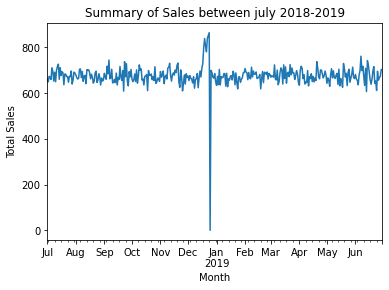

In [30]:
date_index['TOT_SALES'].resample('D').count().plot(kind='line')
plt.xlabel('Month')
plt.ylabel('Total Sales')
plt.title('Summary of Sales between july 2018-2019')

We can see a lot of activity going on in Dec ending.
<p>Let check it out </p>

Text(0.5, 1.0, 'Summary of Sales in December 2018')

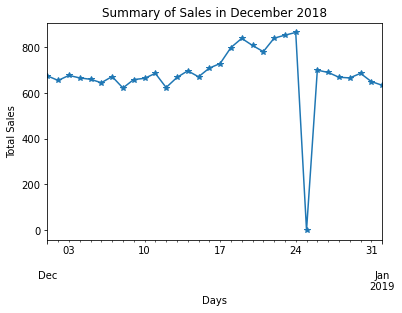

In [31]:
id = date_index['2018-12-01':'2019-01-01']
# Let plot the sales for december
id['TOT_SALES'].resample('D').count().plot(kind='line',marker='*')
plt.xlabel('Days')
plt.ylabel('Total Sales')
plt.title('Summary of Sales in December 2018')

We can see that the increase in sales occurs in the lead-up to Christmas and that
<p>there are zero sales on Christmas day itself. This is due to shops being closed on
Christmas day.</p>

# Let Explore PROD_NAME column

Let check the types of chips in column and their counts

In [32]:
qt.PROD_NAME.value_counts()


Kettle Mozzarella   Basil & Pesto 175g      3304
Kettle Tortilla ChpsHny&Jlpno Chili 150g    3296
Cobs Popd Swt/Chlli &Sr/Cream Chips 110g    3269
Tyrrells Crisps     Ched & Chives 165g      3268
Cobs Popd Sea Salt  Chips 110g              3265
                                            ... 
Sunbites Whlegrn    Crisps Frch/Onin 90g    1432
RRD Pc Sea Salt     165g                    1431
NCC Sour Cream &    Garden Chives 175g      1419
French Fries Potato Chips 175g              1418
WW Crinkle Cut      Original 175g           1410
Name: PROD_NAME, Length: 105, dtype: int64

Let create a variable for number of variable in PROD_NAME as packet size

In [33]:
qt['Pack_Size'] = qt['PROD_NAME'].astype('str').str.extractall(
    '(\d+)').unstack().fillna('').sum(axis=1).astype(int)


In [34]:
# Let explore the Packet_Size dataset
qt['Pack_Size'].describe(include='all')

count    246740.000000
mean        175.583521
std          59.432118
min          70.000000
25%         150.000000
50%         170.000000
75%         175.000000
max         380.000000
Name: Pack_Size, dtype: float64

# Exploration of Packet_Size dataset
<p>We can see that the min packet size is 70kg and the maximum is 380kg

Text(0.5, 0, 'kg')

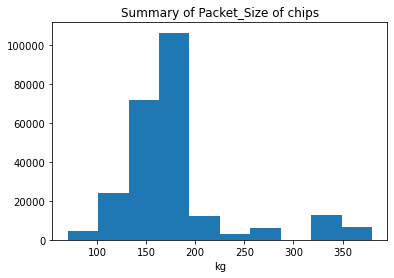

In [35]:
# Let plot histogram to view the data
plt.hist(x=qt['Pack_Size'].values)
plt.title('Summary of Packet_Size of chips')
plt.xlabel('kg')

Let create a column for brand of chips by using their first string

In [36]:
qt['BRAND'] = qt['PROD_NAME'].str.split(' ').str[0]
# Let print out there value value_counts
qt['BRAND'].value_counts()

Kettle        41288
Smiths        27390
Pringles      25102
Doritos       22041
Thins         14075
RRD           11894
Infuzions     11057
WW            10320
Cobs           9693
Tostitos       9471
Twisties       9454
Tyrrells       6442
Grain          6272
Natural        6050
Cheezels       4603
CCs            4551
Red            4427
Dorito         3183
Infzns         3144
Smith          2963
Cheetos        2927
Snbts          1576
Burger         1564
Woolworths     1516
GrnWves        1468
Sunbites       1432
NCC            1419
French         1418
Name: BRAND, dtype: int64

Note: Some of the brand names look like they are of the same brands - such as RED and
RRD, which are both Red Rock Deli chips. Let's combine these together.

In [37]:
qt['BRAND']=qt['BRAND'].replace({'Red':'RRD'})

In [38]:
qt

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,Pack_Size,BRAND
0,2018-10-17,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0,175,Natural
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3,175,CCs
2,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9,170,Smiths
3,2018-08-17,2,2373,974,69,Smiths Chip Thinly S/Cream&Onion 175g,5,15.0,175,Smiths
4,2018-08-18,2,2426,1038,108,Kettle Tortilla ChpsHny&Jlpno Chili 150g,3,13.8,150,Kettle
...,...,...,...,...,...,...,...,...,...,...
264831,2019-03-09,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8,175,Kettle
264832,2018-08-13,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4,175,Tostitos
264833,2018-11-06,272,272379,270187,51,Doritos Mexicana 170g,2,8.8,170,Doritos
264834,2018-12-27,272,272379,270188,42,Doritos Corn Chip Mexican Jalapeno 150g,2,7.8,150,Doritos


# Let provide exploratory about qp dataset ( which contain Lifestage,Premium_Customer)

In [39]:
qp

,LYLTY_CARD_NBR,LIFESTAGE,PREMIUM_CUSTOMER
0,1000,YOUNG SINGLES/COUPLES,Premium
1,1002,YOUNG SINGLES/COUPLES,Mainstream
2,1003,YOUNG FAMILIES,Budget
3,1004,OLDER SINGLES/COUPLES,Mainstream
4,1005,MIDAGE SINGLES/COUPLES,Mainstream
...,...,...,...
72632,2370651,MIDAGE SINGLES/COUPLES,Mainstream
72633,2370701,YOUNG FAMILIES,Mainstream
72634,2370751,YOUNG FAMILIES,Premium
72635,2370961,OLDER FAMILIES,Budget


In [40]:
# Doing some descriptive statistics
qp.describe(include='all')

,LYLTY_CARD_NBR,LIFESTAGE,PREMIUM_CUSTOMER
count,7.263700e+04,72637,72637
unique,NaN,7,3
top,NaN,RETIREES,Mainstream
freq,NaN,14805,29245
mean,1.361859e+05,NaN,NaN
std,8.989293e+04,NaN,NaN
min,1.000000e+03,NaN,NaN
25%,6.620200e+04,NaN,NaN
50%,1.340400e+05,NaN,NaN
75%,2.033750e+05,NaN,NaN


Result: In this dataset we have 72637 rows and 3 columns

Exploring the Premium of customer with histogram

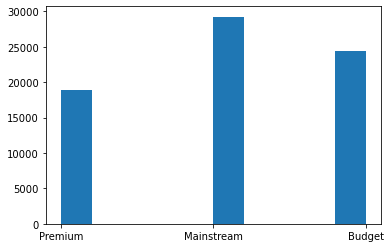

<Figure size 288000x288000 with 0 Axes>

In [41]:
plt.hist(qp['PREMIUM_CUSTOMER'])
f = plt.figure(figsize=(4000,4000))

We can see that the Mainstream is the most customers we have in our store

Lifestage of the customer

In [42]:
qp['LIFESTAGE'].value_counts()

RETIREES                  14805
OLDER SINGLES/COUPLES     14609
YOUNG SINGLES/COUPLES     14441
OLDER FAMILIES             9780
YOUNG FAMILIES             9178
MIDAGE SINGLES/COUPLES     7275
NEW FAMILIES               2549
Name: LIFESTAGE, dtype: int64

we can see that Retired people are the most in our store

# Merging qp and qt dataframe together by LYLTY_CARD_NBR

In [43]:
customer_data = pd.merge(qt,qp,on='LYLTY_CARD_NBR')

In [44]:
customer_data.head()

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,Pack_Size,BRAND,LIFESTAGE,PREMIUM_CUSTOMER
0,2018-10-17,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0,175,Natural,YOUNG SINGLES/COUPLES,Premium
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3,175,CCs,MIDAGE SINGLES/COUPLES,Budget
2,2018-11-10,1,1307,346,96,WW Original Stacked Chips 160g,2,3.8,160,WW,MIDAGE SINGLES/COUPLES,Budget
3,2019-03-09,1,1307,347,54,CCs Original 175g,1,2.1,175,CCs,MIDAGE SINGLES/COUPLES,Budget
4,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9,170,Smiths,MIDAGE SINGLES/COUPLES,Budget


Save the customer data to csv

In [45]:
customer_data.to_csv('Customer_Data.csv')

# Let Perform Exploraatory Analyses on our New Dataset

Exploring the Premium of customer with histogram

Exploring the Premium of customer with histogram

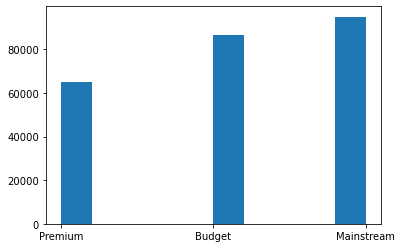

<Figure size 288000x288000 with 0 Axes>

In [46]:
plt.hist(customer_data['PREMIUM_CUSTOMER'])
f = plt.figure(figsize=(4000,4000))

Plotting Premium customer with total sales using pie chart

In [71]:
import plotly.express as px
px.pie(customer_data, values='TOT_SALES',names='PREMIUM_CUSTOMER')

Let Explore the Lifestage of the customer

In [48]:
px.pie(customer_data, values='TOT_SALES',names='LIFESTAGE')

Creating a dataframe to explore the relationship between lifestage and premium customer

In [49]:
met = customer_data[['TOT_SALES','LIFESTAGE','PREMIUM_CUSTOMER']]
met1 = met.groupby(['LIFESTAGE','PREMIUM_CUSTOMER'],as_index=False).sum()
met2 = met1.pivot(index='LIFESTAGE', columns='PREMIUM_CUSTOMER')

In [50]:
met2

TOT_SALES                      
PREMIUM_CUSTOMER           Budget Mainstream    Premium
LIFESTAGE                                              
MIDAGE SINGLES/COUPLES   33345.70   84734.25   54443.85
NEW FAMILIES             20607.45   15979.70   10760.80
OLDER FAMILIES          156863.75   96413.55   75242.60
OLDER SINGLES/COUPLES   127833.60  124648.50  123537.55
RETIREES                105916.30  145168.95   91296.65
YOUNG FAMILIES          129717.95   86338.25   78571.70
YOUNG SINGLES/COUPLES    57122.10  147582.20   39052.30

<AxesSubplot:title={'center':'Lifestage and Premium customer relationship to Total Sales'}, xlabel='LIFESTAGE'>

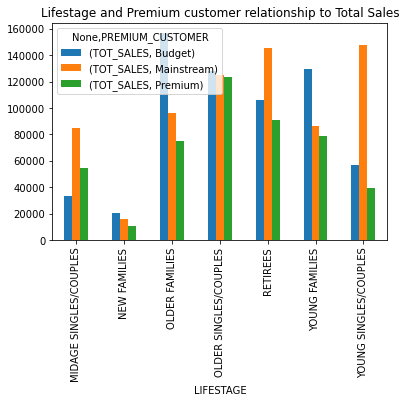

In [51]:
met2.plot(kind='bar',title='Lifestage and Premium customer relationship to Total Sales')

we can see from the visual that 
<p> For budget= The Older families have most purchase </p>
<p> For Mainsream = The YOUNG SINGLES/COUPLES have most purchase </p>
<p> For Premium = The YOUNG Older families have most purchase </p>
Also, There are more Mainstream - young singles/couples and Mainstream - retirees who buy
chips. This contributes to there being more sales to these customer segments but
this is not a major driver for the Budget - Older families segment.

# Average number of units per customer by LIFESTAGE and PREMIUM_CUSTOMER

In [52]:
met = customer_data[['TOT_SALES', 'LIFESTAGE', 'PREMIUM_CUSTOMER']]
met10 = met.groupby(['LIFESTAGE', 'PREMIUM_CUSTOMER'], as_index=False).mean()
met20 = met1.pivot(index='PREMIUM_CUSTOMER', columns='LIFESTAGE')


In [53]:
met20

TOT_SALES                              \
LIFESTAGE        MIDAGE SINGLES/COUPLES NEW FAMILIES OLDER FAMILIES   
PREMIUM_CUSTOMER                                                      
Budget                         33345.70     20607.45      156863.75   
Mainstream                     84734.25     15979.70       96413.55   
Premium                        54443.85     10760.80       75242.60   

                                                                  \
LIFESTAGE        OLDER SINGLES/COUPLES   RETIREES YOUNG FAMILIES   
PREMIUM_CUSTOMER                                                   
Budget                       127833.60  105916.30      129717.95   
Mainstream                   124648.50  145168.95       86338.25   
Premium                      123537.55   91296.65       78571.70   

                                        
LIFESTAGE        YOUNG SINGLES/COUPLES  
PREMIUM_CUSTOMER                        
Budget                         57122.1  
Mainstream                    147582.2  
Premium                        39052.3

Older families and young families in general buy more chips per customer

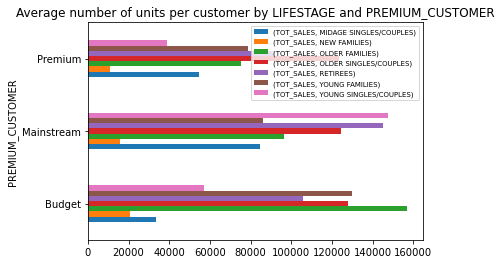

<Figure size 216000x3.6e+06 with 0 Axes>

In [54]:
# Let create a plot
k= met20.plot(kind='barh',title='Average number of units per customer by LIFESTAGE and PREMIUM_CUSTOMER')
plt.legend(prop={'size':7})
plt.figure(figsize=(3000,50000))
plt.show()



Mainstream midage and young singles and couples are more willing to pay more per
packet of chips compared to their budget and premium counterparts. This may be due
to premium shoppers being more likely to buy healthy snacks and when they buy
chips, this is mainly for entertainment purposes rather than their own consumption.
This is also supported by there being fewer premium midage and young singles and
couples buying chips compared to their mainstream counterparts.

# Checking for differences among the variables
Perform an independent t-test between mainstream vs premium and budget midage
and young singles and couples

In [55]:
# Let show the customer data 
customer_data

,DATE,STORE_NBR,LYLTY_CARD_NBR,TXN_ID,PROD_NBR,PROD_NAME,PROD_QTY,TOT_SALES,Pack_Size,BRAND,LIFESTAGE,PREMIUM_CUSTOMER
0,2018-10-17,1,1000,1,5,Natural Chip Compny SeaSalt175g,2,6.0,175,Natural,YOUNG SINGLES/COUPLES,Premium
1,2019-05-14,1,1307,348,66,CCs Nacho Cheese 175g,3,6.3,175,CCs,MIDAGE SINGLES/COUPLES,Budget
2,2018-11-10,1,1307,346,96,WW Original Stacked Chips 160g,2,3.8,160,WW,MIDAGE SINGLES/COUPLES,Budget
3,2019-03-09,1,1307,347,54,CCs Original 175g,1,2.1,175,CCs,MIDAGE SINGLES/COUPLES,Budget
4,2019-05-20,1,1343,383,61,Smiths Crinkle Cut Chips Chicken 170g,2,2.9,170,Smiths,MIDAGE SINGLES/COUPLES,Budget
...,...,...,...,...,...,...,...,...,...,...,...,...
246735,2019-03-09,272,272319,270088,89,Kettle Sweet Chilli And Sour Cream 175g,2,10.8,175,Kettle,YOUNG SINGLES/COUPLES,Premium
246736,2018-08-13,272,272358,270154,74,Tostitos Splash Of Lime 175g,1,4.4,175,Tostitos,YOUNG SINGLES/COUPLES,Premium
246737,2018-11-06,272,272379,270187,51,Doritos Mexicana 170g,2,8.8,170,Doritos,YOUNG SINGLES/COUPLES,Premium
246738,2018-12-27,272,272379,270188,42,Doritos Corn Chip Mexican Jalapeno 150g,2,7.8,150,Doritos,YOUNG SINGLES/COUPLES,Premium


In [56]:
# Importing the scipy library
import scipy.stats as stats

In [57]:
# Performing an independent t-test between mainstream vs premium
pr = stats.ttest_ind(customer_data['TOT_SALES'][customer_data['PREMIUM_CUSTOMER'] == 'Mainstream'],
                     customer_data['TOT_SALES'][customer_data['PREMIUM_CUSTOMER'] =='Premium'])
pr

Ttest_indResult(statistic=7.274853694658667, pvalue=3.483741722163687e-13)

Result of the test shows that there is statistical significant difference between mainstream and premium customer. Since p-value is less than 0.05 and t=7.28

# Let the LIFESTAGE of the customer

In [58]:
# Exploring the differences between Midage singles/couples and young singles/couples
pr1 = stats.ttest_ind(customer_data['TOT_SALES'][customer_data['LIFESTAGE'] == 'MIDAGE SINGLES/COUPLES'],
                      customer_data['TOT_SALES'][customer_data['LIFESTAGE'] == 'YOUNG SINGLES/COUPLES'])
pr1


Ttest_indResult(statistic=9.157454476390619, pvalue=5.482774689321049e-20)

Result of the test shows that there is statistical significant difference between Midage singles/couples and young singles/couples customer. Since p-value is less than 0.05 and t=9.158

In [59]:
customer_data['LIFESTAGE'].value_counts()

OLDER SINGLES/COUPLES     50793
RETIREES                  46431
OLDER FAMILIES            45158
YOUNG FAMILIES            40494
YOUNG SINGLES/COUPLES     33969
MIDAGE SINGLES/COUPLES    23398
NEW FAMILIES               6497
Name: LIFESTAGE, dtype: int64

In [60]:
# Exploring the differences between Midage RETIREES and OLDER FAMILIES
pr2 = stats.ttest_ind(customer_data['TOT_SALES'][customer_data['LIFESTAGE'] == 'RETIREES'],
                      customer_data['TOT_SALES'][customer_data['LIFESTAGE'] == 'OLDER FAMILIES'])
pr2


Ttest_indResult(statistic=6.106405715247406, pvalue=1.0230774812984913e-09)

Result of the test shows that there is statistical significant difference betweenMidage RETIREES and OLDER FAMILIES customer. Since p-value is less than 0.05 and t=6.106

# Performing apriori analysis to the buying patterns of different brands in our dataset
We use this techique to find out if there are brands that these two customer segments prefer more than others or there buying pattern goes together

In [61]:
import mlxtend
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules


In [62]:
df = customer_data[['LIFESTAGE', 'TXN_ID', 'BRAND', 'TOT_SALES']]


In [63]:
df['PROD_NAME'] = df['BRAND'].str.strip()
df.dropna(axis=0,subset=['TXN_ID'],inplace=True)
df['TXN_ID'] = df['TXN_ID'].astype('str')


C:\Users\User\AppData\Local\Temp/ipykernel_5028/981865250.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\User\anaconda3\lib\site-packages\pandas\util\_decorators.py:311: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\User\AppData\Local\Temp/ipykernel_5028/981865250.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-

In [64]:
basket = (df.groupby(['TXN_ID', 'BRAND'])['TOT_SALES'].sum().unstack().reset_index().fillna(0).set_index('TXN_ID'))


In [65]:
def encode_0_1(x):
    if x <=0:
        return 0
    if x >=1:
        return 1
    
basket_sets = basket.applymap(encode_0_1)

In [67]:
frequent_itemsets = apriori(basket_sets,min_support=0.01, use_colnames=True)
frequent_itemsets

,support,itemsets
0,0.018548,(CCs)
1,0.011935,(Cheetos)
2,0.018764,(Cheezels)
3,0.039518,(Cobs)
4,0.012978,(Dorito)
5,0.089809,(Doritos)
6,0.025569,(Grain)
7,0.045080,(Infuzions)
8,0.012819,(Infzns)
9,0.168221,(Kettle)


From this pattern we can see that these are the similar pattern among the brands